In [1]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt
#import matplotlib.image as mpimg
import os
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# 1. Basic Image Operations
## 1.1 Image Read/Write

In [2]:
def my_imread(imagepath):
    
    image = plt.imread(imagepath) # Read the image from imagepath.
    return image

IMG_NAME = '8023.jpg' # Choose an image filename from "data/img/"
IMG_PATH = os.path.join('data/img/', IMG_NAME)
image = my_imread(IMG_PATH)

In [ ]:
cv2.imshow('image', image)
cv2.waitKey(0)
cv2.destroyAllWindows()


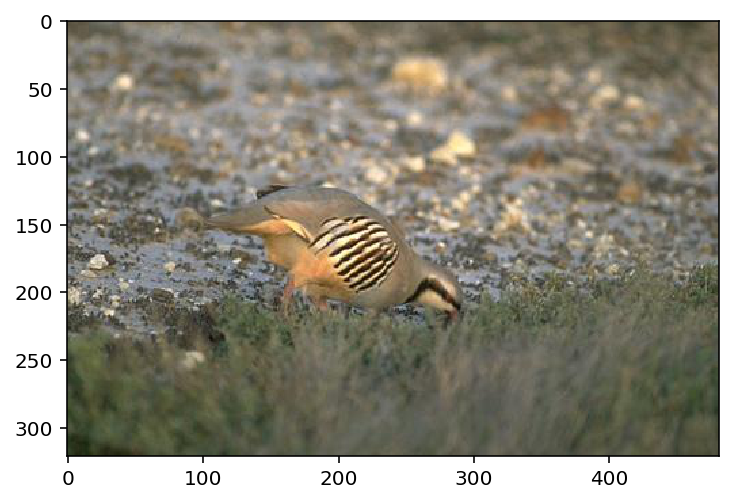

In [3]:
# b) Display the correct color in RGB 
plt.imshow(image) 

In [ ]:
RGB_FILENAME = "problem1_color.jpg"
GRAY_FILENAME = "problem1_gray.jpg"
plt.imsave(RGB_FILENAME,image)

def RGB2GRAY(image):
    return(cv2.cvtColor(image,cv2.COLOR_RGB2GRAY))
    grayImg=np.zeros(image.shape[:2])
    #print(grayImg.shape)
    for row in range(image.shape[0]):
        for col in range(image.shape[1]):
            r,g,b=image[row,col]
            #print(r,g,b)
            grayImg[row,col]=0.299 * r + 0.587 * g + 0.114 * b
    return grayImg
            
    
plt.imsave(GRAY_FILENAME,RGB2GRAY(image))

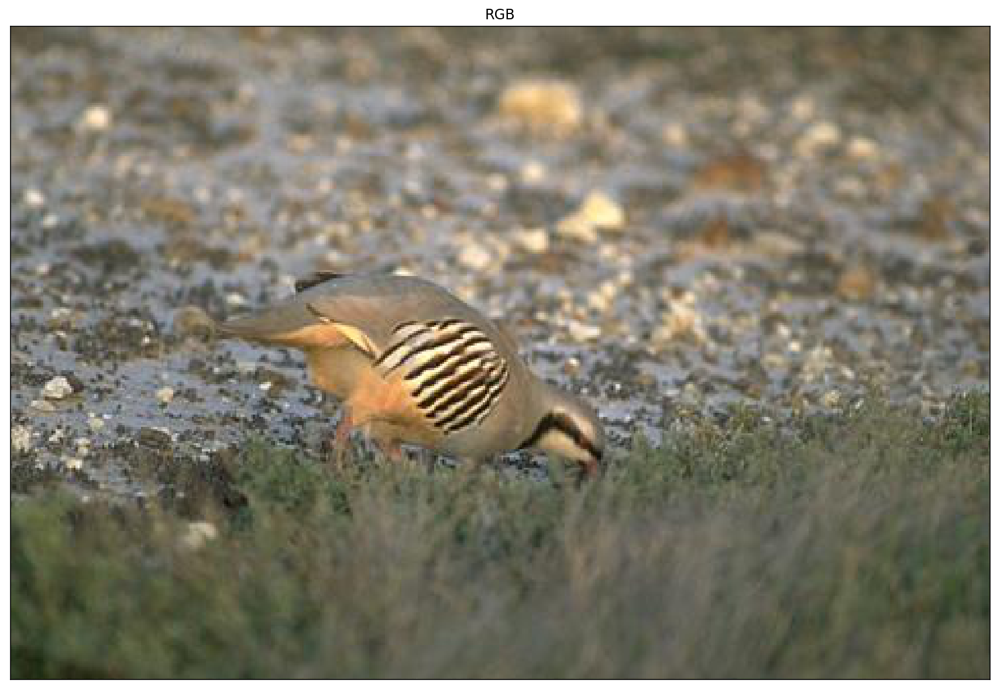

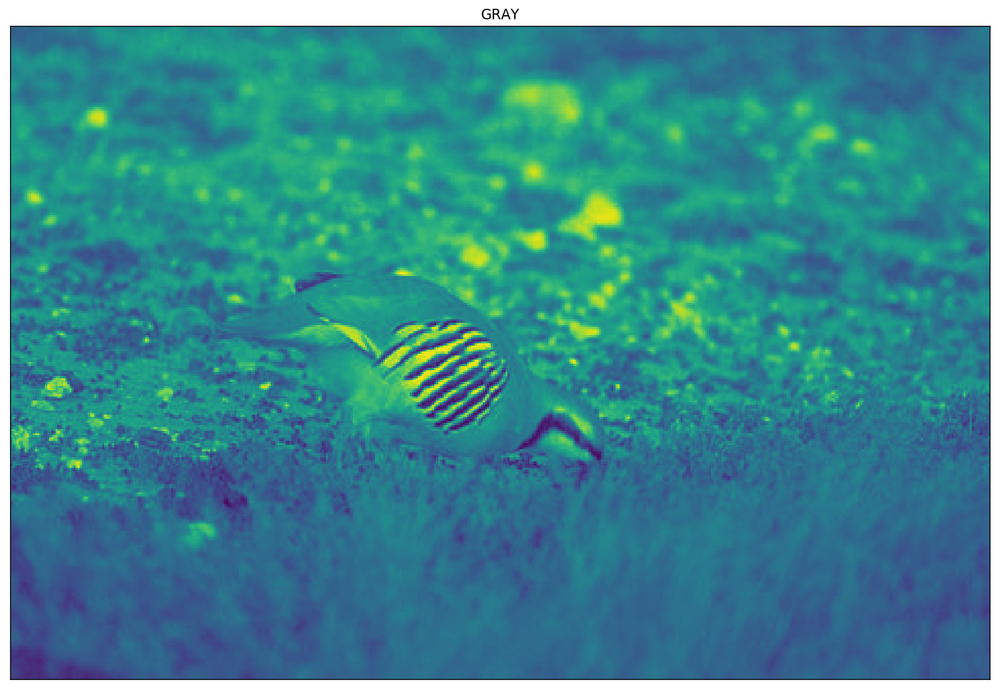

In [9]:
plot_helper(image,'RGB')
plot_helper(plt.imread(GRAY_FILENAME),'GRAY')


## 1.2 Image Smoothing

In [8]:

def plot_helper(rgb_img, title):
    plt.figure(figsize=(15, 15)) # the figure size can be adjusted to make sure the images are clear for grading.
    plt.subplot(111), 
    plt.imshow(rgb_img), 
    plt.title(title)
    plt.xticks([]), 
    plt.yticks([])
    plt.show()

In [13]:
import time


kernel sizes are: [5, 15, 25]


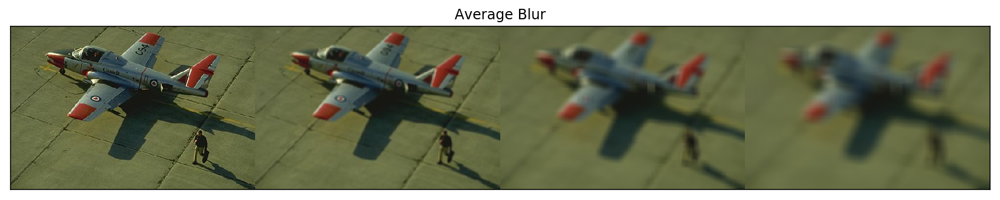

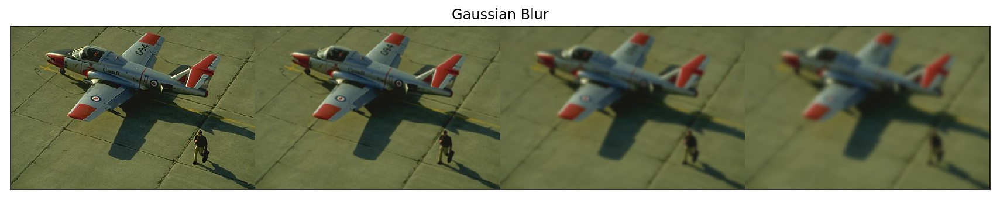

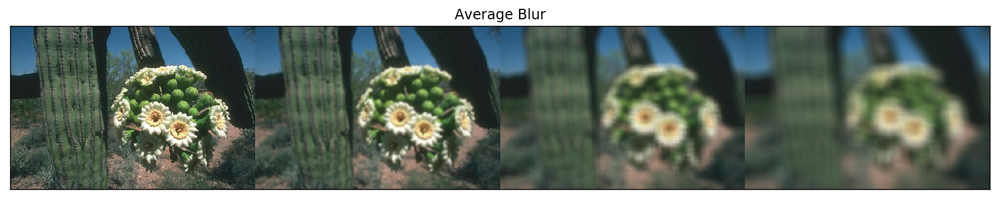

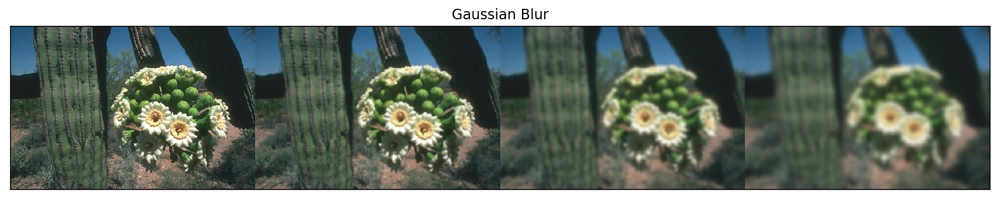

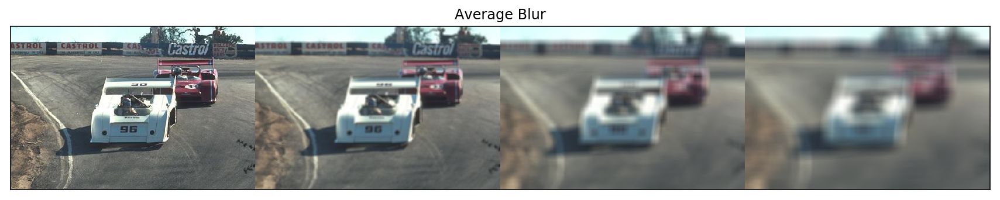

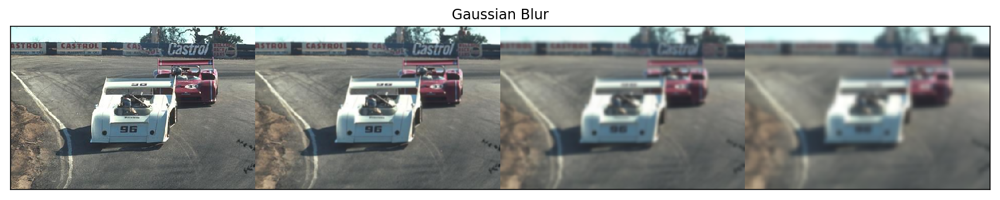

In [14]:
IMAGES = ["37073.jpg","19021.jpg", "21077.jpg"] # choose 3 images from "data/img"
KERNEL_SIZES = [5, 15, 25] # choose at least 3 different filter sizes
print("kernel sizes are:", KERNEL_SIZES)
for i in range(len(IMAGES)):
    imagepath = os.path.join('data/img/', IMAGES[i])
    image = my_imread(imagepath)
    avg_blurs = [image]
    gaus_blurs = [image]
    for j in range(len(KERNEL_SIZES)):
        kernel_size = KERNEL_SIZES[j]
        # a) average smoothing
        avg_blur = cv2.blur(image,(kernel_size,kernel_size))
        avg_blurs.append(avg_blur)
        # b) gaussian smoothing
        gaus_blur = cv2.GaussianBlur(image,(kernel_size,kernel_size),0)
        gaus_blurs.append(gaus_blur)
    avg_stack = np.hstack(avg_blurs)
    gaus_stack = np.hstack(gaus_blurs)
    plot_helper(avg_stack,'Average Blur')
    plot_helper(gaus_stack,'Gaussian Blur')
    time.sleep(2)


### Observations

<b>Mean/Avg kernel:</b>
Some of the ideas borrowed form https://homepages.inf.ed.ac.uk/rbf/HIPR2/mean.htm and http://www.cs.cornell.edu/courses/cs1114/2013sp/sections/S06_convolution.pdf)
The mean filter simply replaces each pixel in the input with the mean of its neighbouring pixels as governed by the size of the kernel.
High frequency components,such as edges on the cars and contrasting points on the plane are smoothened. 
As kernel size is increased, the image blurring increases accordingly. The kernel size should be decided based on the contenf of image. Small kernels for high frequency images is suitable. 

Disadvantages: - 
Does not consider context 
May be used in noise removal but have to compromize with sharpness - specially a problem when edges are important. 
If there is a highly misrepresentative pixel(s) in the neighbourhood, it is possible that the smoothing deterorates the quality. 

<b>Gaussian Filtering</b>
Gaussian filter, like mean filter is a linear filter. Smoothing depends on std deviation and also the mean of the gaussinan kernel. Much greater smoothing is obtained if std deviation in increased. If set to too small a value, edges are preserved, but the required amount of smoothing may not be obtained. 
One particular disadvantage is, unlike mean filter, it does not help much in fixing a pixel which has a very non representational value. It is perhaps better when edges are to be preserved to a certain extent.
_______________________________
_______________________________

## 1.3 Denoising

In [15]:
import glob
imagepaths = glob.glob('data/snp/*.jpg')

Filter size 3


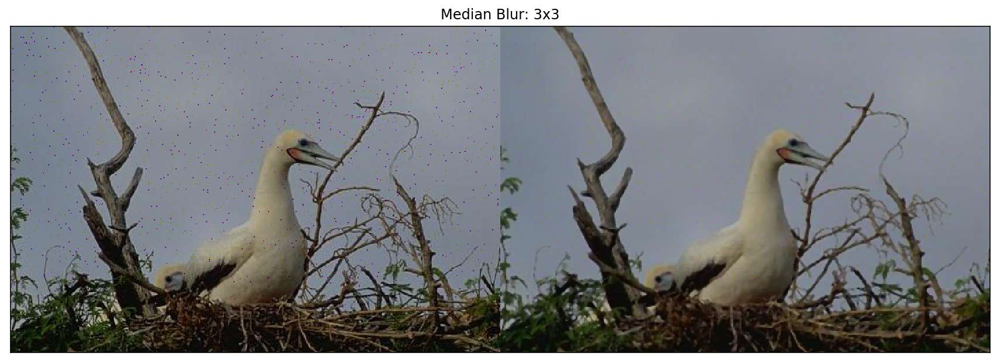

Filter size 7


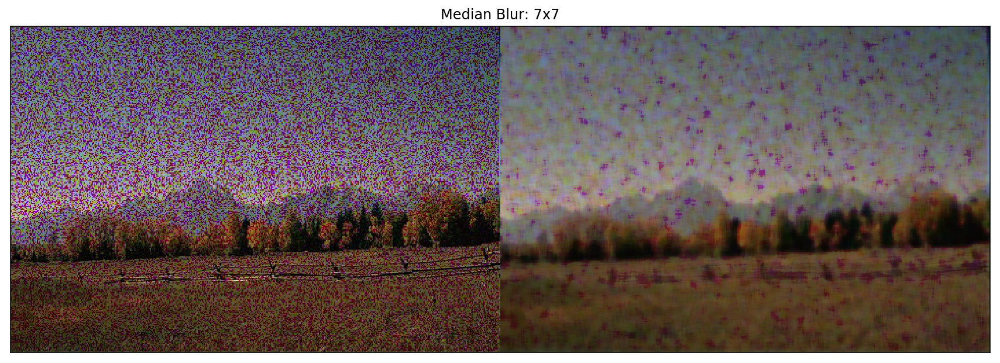

Filter size 5


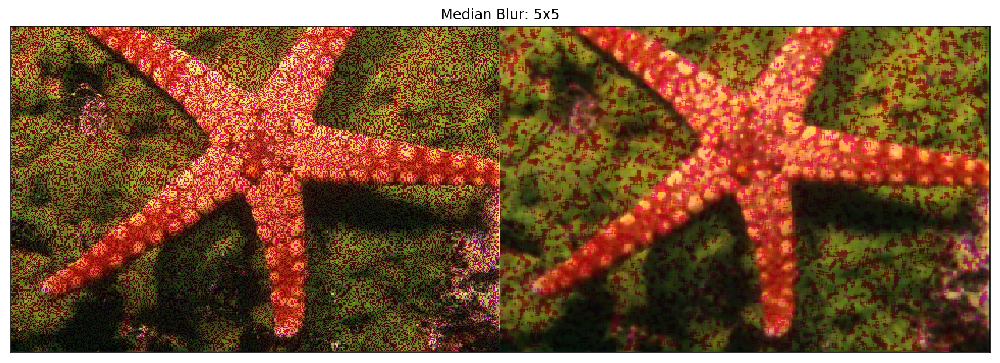

Filter size 3


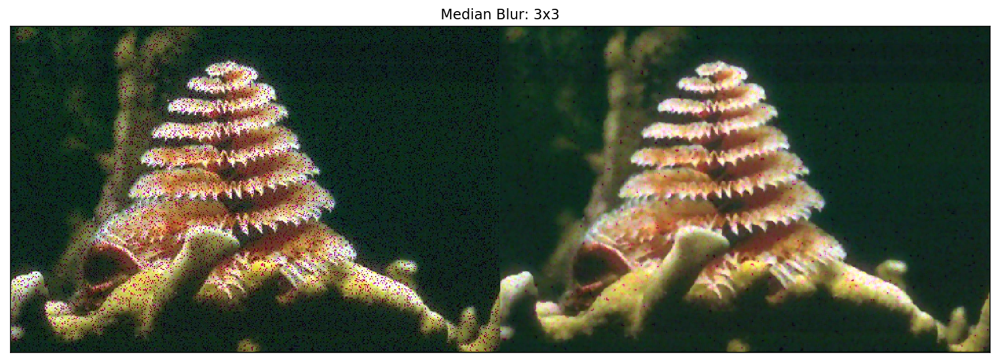

Filter size 3


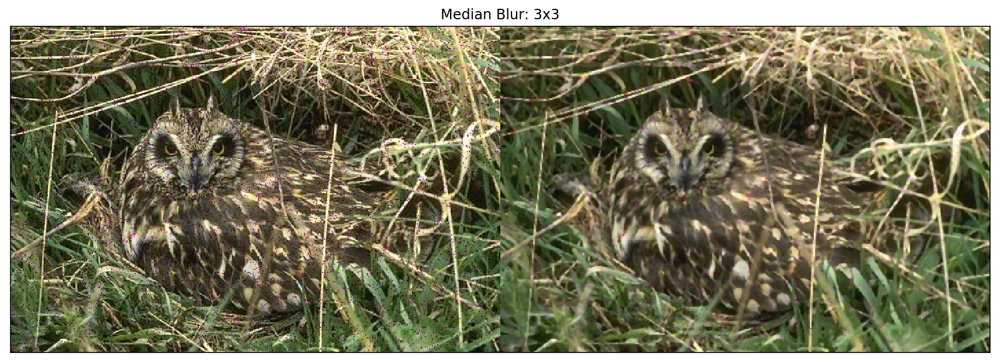

In [17]:
MEDIAN_FILTERS = [3,7,5,3,3] # Filter sizes for each image.
for i, imagepath in enumerate(imagepaths):
    image = my_imread(imagepath)
    median = cv2.medianBlur(image,MEDIAN_FILTERS[i]) # Apply the median filter on this image.
    print("Filter size", MEDIAN_FILTERS[i])
    stack = np.hstack((image, median))
    plot_helper(stack, 'Median Blur: %dx%d'%(MEDIAN_FILTERS[i], MEDIAN_FILTERS[i]))
    time.sleep(2)

I notice that median filter helps the most 
- naturally depending on the median of the pixel values. If the correct pixel value is the median, then the output is 100 percent accurate. This was nearly the case for image 1. 
- This happens when the noise is gaussian with mean at 0, which ensure that median is correct pixel value.
- If the noise is too diverse then it is unlikely that median filtering will help, as in the image of the forest.
- This is not functioning as a filter, certanly not a linear one. 
-Size of the filter is mentioned above each image